# **Глубокий анализ данных**
Этот ноутбук предназначен для глубокого анализа данных и поиска аномалий в них.\
Помимо графиков, будут использованы разные статистические подходы, а также\
XGB и LGBM для выявления полезных и, возможно, шумовых признаков.
- **Выявление корреляций**
- **Оценка дисперсии признаков**
- **Оценка признаков с помощью LGBM и XGB**
- **Поиск шума в данных**

## **Модули**

In [1]:
import lightgbm
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, roc_auc_score
from sklearn.decomposition import PCA, KernelPCA, SparsePCA, IncrementalPCA

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly_express as px
import shap

import os
import numpy as np

import warnings
warnings.filterwarnings('ignore')
sns.set_style('darkgrid')
pd.set_option('display.max_columns', None)
%matplotlib inline

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


## **Загрузка данных**

In [4]:
# Пути
ROOT = os.getcwd()
TRAIN_DATASET = os.path.join(ROOT, '../data/train_AIC.csv')
TEST_DATASET = os.path.join(ROOT, '../data/test_AIC.csv')

In [5]:
# Загрузка датасетов
train_df = pd.read_csv(TRAIN_DATASET)
test_df = pd.read_csv(TEST_DATASET)

# Помечаем категориальные признаки
CATEGORY_COLS = ['Поставщик', 'Материал', 'Категорийный менеджер', 'Операционный менеджер',
                 'Завод', 'Закупочная организация', 'Группа закупок', 'Балансовая единица',
                 'ЕИ', 'Группа материалов', 'Вариант поставки']

train_df[CATEGORY_COLS] = train_df[CATEGORY_COLS].astype('category')

# Новые имена признаков
RENAME_COLS = ['Provider', 'Material', 'Category_Manager', 'Operations_Manager',
               'Factory', 'Purchasing_Organization', 'Purchasing_Group',
               'Company_Code', 'EI', 'Material_Group', 'Delivery_Option',
               'NRP', 'Duration', 'ETA_Delivery', 'Month1', 'Month2', 'Month3',
               'Weekday', 'Sum', 'Position_Count', 'Amount', 'Handlers_7',
               'Handlers_15', 'Handlers_30', 'Order_Approval_1', 'Order_Approval_2',
               'Order_Approval_3', 'Change_Delivery_Date_7', 'Change_Delivery_Date_15',
               'Change_Delivery_Date_30', 'Cancel_Complete_Release', 'Change_on_Paper',
               'Delivery_Date', 'Approval_Cycles', 'Changes_After_Approvals',
               'Days_Between_0_1', 'Days_Between_1_2', 'Days_Between_2_3', 'Days_Between_3_4',
               'Days_Between_4_5', 'Days_Between_5_6', 'Days_Between_6_7', 'Days_Between_7_8', 'y']

train_df.columns = RENAME_COLS


# Удаление дубликатов из тренировочной выборки
train_df = train_df.drop_duplicates()

# Разделение выборки на тренировочную и тестовую
X, y = train_df.iloc[:, :-1], train_df.iloc[:, -1]   
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## **Вспомогательные функции**

In [6]:
def valid_preds(y_true, y_pred):
    print(f"F1-macro: {f1_score(y_true, y_pred, average='macro')}")
    print(f'ROC-AUC: {roc_auc_score(y_true, y_pred)}')

## **Визуализация**

### **Распределение данных**

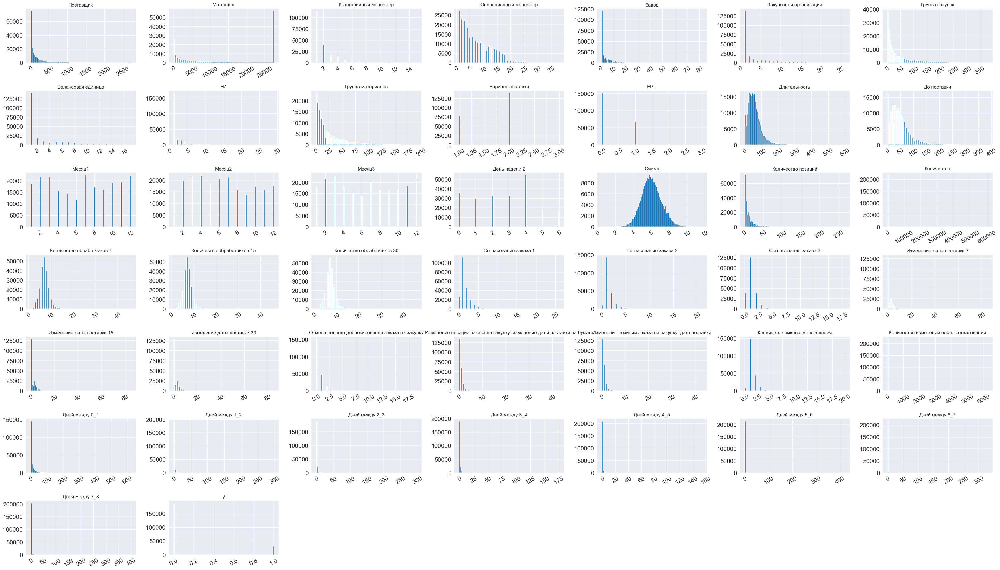

In [4]:
fig = train_df.hist(figsize=(35, 20), bins=100, xlabelsize=15, ylabelsize=15, xrot=30)
plt.tight_layout()
plt.show()

### **Матрица корреляции** 

In [5]:
fig = px.imshow(train_df.corr(), width=1500, height=1200)
fig.show()

In [6]:
train_df.describe()

,Поставщик,Материал,Категорийный менеджер,Операционный менеджер,Завод,Закупочная организация,Группа закупок,Балансовая единица,ЕИ,Группа материалов,Вариант поставки,НРП,Длительность,До поставки,Месяц1,Месяц2,Месяц3,День недели 2,Сумма,Количество позиций,Количество,Количество обработчиков 7,Количество обработчиков 15,Количество обработчиков 30,Согласование заказа 1,Согласование заказа 2,Согласование заказа 3,Изменение даты поставки 7,Изменение даты поставки 15,Изменение даты поставки 30,Отмена полного деблокирования заказа на закупку,Изменение позиции заказа на закупку: изменение даты поставки на бумаге,Изменение позиции заказа на закупку: дата поставки,Количество циклов согласования,Количество изменений после согласований,Дней между 0_1,Дней между 1_2,Дней между 2_3,Дней между 3_4,Дней между 4_5,Дней между 5_6,Дней между 6_7,Дней между 7_8,y
count,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.00000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000
mean,257.174924,12179.739755,2.490987,7.370987,4.113746,3.001938,46.510688,2.707727,1.658744,25.636942,1.652776,0.312886,58.396148,47.984569,6.54257,6.282098,6.404685,2.722981,6.029473,14.275467,350.204859,7.058940,7.177283,7.261888,1.577602,1.427504,1.174229,1.564550,1.568339,1.570785,0.470133,0.589452,0.613669,1.392227,13.998162,11.488985,1.649858,0.976623,0.168801,0.005646,-0.389463,-0.550603,1.643132,0.143953
std,431.087116,11026.107644,2.320434,5.566062,6.027087,3.648353,56.709336,3.074474,1.628628,28.098157,0.496262,0.464061,43.579565,40.067584,3.59556,3.373563,3.555460,1.825841,1.145611,23.221356,5670.757005,2.019189,2.018758,2.014442,1.489433,1.028813,0.973788,2.561923,2.566687,2.570338,0.969584,1.050705,1.042153,0.974461,33.117008,28.663269,8.976600,5.997171,2.799125,2.421106,6.177057,5.440240,13.953111,0.351043
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.00000,1.000000,1.000000,0.000000,0.485452,1.000000,0.001000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000
25%,14.000000,1600.000000,1.000000,3.000000,1.000000,1.000000,7.000000,1.000000,1.000000,6.000000,1.000000,0.000000,30.000000,21.000000,3.00000,3.000000,3.000000,1.000000,5.267620,3.000000,2.000000,6.000000,6.000000,6.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000
50%,81.000000,8261.000000,1.000000,6.000000,1.000000,1.000000,22.000000,1.000000,1.000000,15.000000,2.000000,0.000000,50.000000,40.000000,7.00000,6.000000,6.000000,3.000000,5.971622,7.000000,6.000000,7.000000,7.000000,7.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,13.000000,2.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000
75%,297.000000,27439.000000,3.000000,11.000000,5.000000,3.000000,66.000000,3.000000,1.000000,36.000000,2.000000,1.000000,76.000000,64.000000,10.00000,9.000000,10.000000,4.000000,6.745308,16.000000,28.000000,8.000000,8.000000,8.000000,2.000000,2.000000,1.000000,3.000000,3.000000,3.000000,1.000000,1.000000,1.000000,2.000000,18.000000,9.000000,0.000000,1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000
max,2720.000000,27439.000000,15.000000,38.000000

## **Оценка признаков с помощью LGBM и XGB**

In [34]:
train_df.describe()

,NRP,Duration,ETA_Delivery,Month1,Month2,Month3,Weekday,Sum,Position_Count,Amount,Handlers_7,Handlers_15,Handlers_30,Order_Approval_1,Order_Approval_2,Order_Approval_3,Change_Delivery_Date_7,Change_Delivery_Date_15,Change_Delivery_Date_30,Cancel_Complete_Release,Change_on_Paper,Delivery_Date,Approval_Cycles,Changes_After_Approvals,Days_Between_0_1,Days_Between_1_2,Days_Between_2_3,Days_Between_3_4,Days_Between_4_5,Days_Between_5_6,Days_Between_6_7,Days_Between_7_8,y
count,220342.000000,220342.000000,220342.000000,220342.00000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000,220342.000000
mean,0.312886,58.396148,47.984569,6.54257,6.282098,6.404685,2.722981,6.029473,14.275467,350.204859,7.058940,7.177283,7.261888,1.577602,1.427504,1.174229,1.564550,1.568339,1.570785,0.470133,0.589452,0.613669,1.392227,13.998162,11.488985,1.649858,0.976623,0.168801,0.005646,-0.389463,-0.550603,1.643132,0.143953
std,0.464061,43.579565,40.067584,3.59556,3.373563,3.555460,1.825841,1.145611,23.221356,5670.757005,2.019189,2.018758,2.014442,1.489433,1.028813,0.973788,2.561923,2.566687,2.570338,0.969584,1.050705,1.042153,0.974461,33.117008,28.663269,8.976600,5.997171,2.799125,2.421106,6.177057,5.440240,13.953111,0.351043
min,0.000000,0.000000,0.000000,1.00000,1.000000,1.000000,0.000000,0.485452,1.000000,0.001000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000
25%,0.000000,30.000000,21.000000,3.00000,3.000000,3.000000,1.000000,5.267620,3.000000,2.000000,6.000000,6.000000,6.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000
50%,0.000000,50.000000,40.000000,7.00000,6.000000,6.000000,3.000000,5.971622,7.000000,6.000000,7.000000,7.000000,7.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,13.000000,2.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000
75%,1.000000,76.000000,64.000000,10.00000,9.000000,10.000000,4.000000,6.745308,16.000000,28.000000,8.000000,8.000000,8.000000,2.000000,2.000000,1.000000,3.000000,3.000000,3.000000,1.000000,1.000000,1.000000,2.000000,18.000000,9.000000,0.000000,1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000
max,3.000000,600.000000,385.000000,12.00000,12.000000,12.000000,6.000000,11.666684,267.000000,604703.000000,46.000000,46.000000,46.000000,26.000000,21.000000,18.000000,85.000000,85.000000,85.000000,19.000000,43.000000,43.000000,20.000000,6255.000000,623.000000,297.000000,297.000000,176.000000,154.000000,422.000000,329.000000,399.000000,1.000000


### **LGBM**

In [20]:
# Параметры
params_lgbm = {
    'boosting_type': 'gbdt',
    'objective': 'binary',
    'force_row_wise': True,
    'n_estimators': 3000,
    'reg_lambda': 0.2,
    # 'is_unbalance': True
}

# Модель
model_lgbm = LGBMClassifier(**params_lgbm)

In [7]:
# Обучение и получение предсказаний
model_lgbm.fit(X_train, y_train)
preds_lgbm = model_lgbm.predict(X_test)

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Number of positive: 25366, number of negative: 150907
[LightGBM] [Info] Total Bins 20651
[LightGBM] [Info] Number of data points in the train set: 176273, number of used features: 43
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.143902 -> initscore=-1.783254
[LightGBM] [Info] Start training from score -1.783254


In [15]:
valid_preds(y_test, preds_lgbm)

F1-macro: 0.8753357939510974
ROC-AUC: 0.8667787213732222


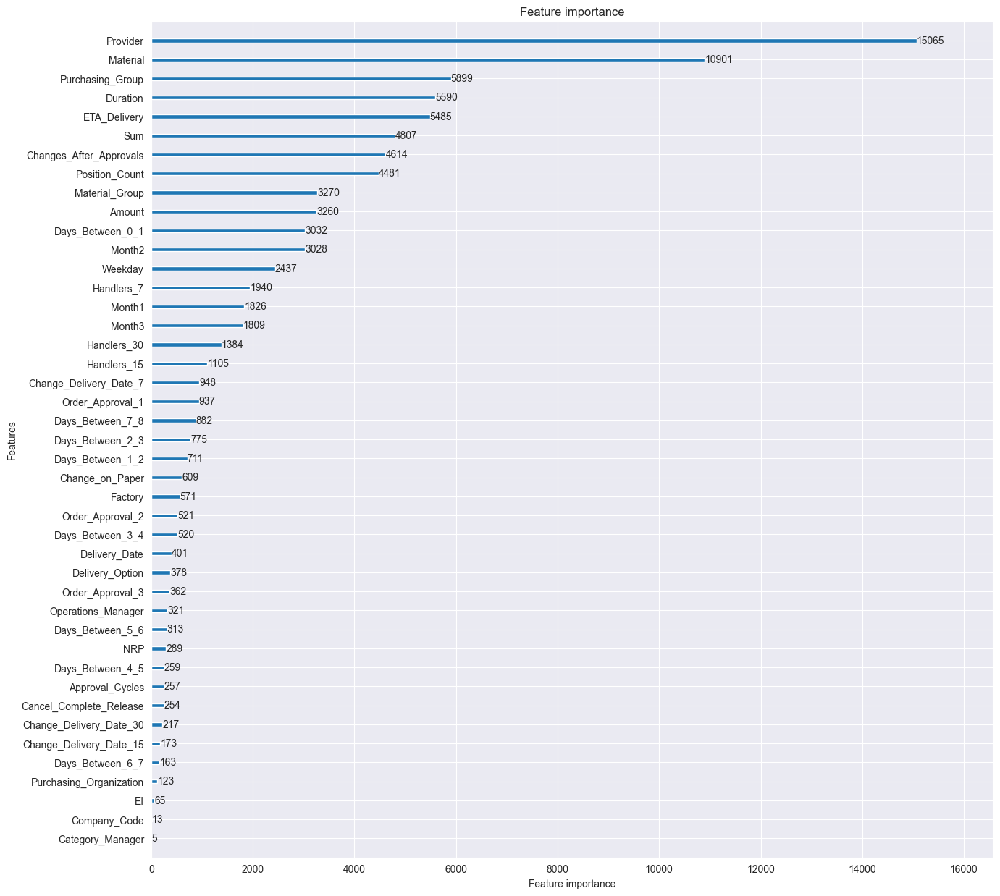

In [12]:
lightgbm.plot_importance(model_lgbm, figsize=(15, 15))
plt.show()

### **XGB**

In [3]:
# Параметры
params_xgb = {
    'booster': 'gbtree',
    'device': 'cpu',
    'enable_categorical': True,
    'objective': 'binary:logistic',
    'n_estimators': 3000,
    'lambda': 0.2,
    'is_unbalance': True
}

# Модель
model_xgb = XGBClassifier(**params_xgb)

In [ ]:
# Обучение и получение предсказаний
model_xgb.fit(X_train, y_train)
preds_xgb = model_xgb.predict(X_test)

In [ ]:
valid_preds(y_test, preds_xgb)

F1-macro: 0.8879022864413886
ROC-AUC: 0.866483697900304


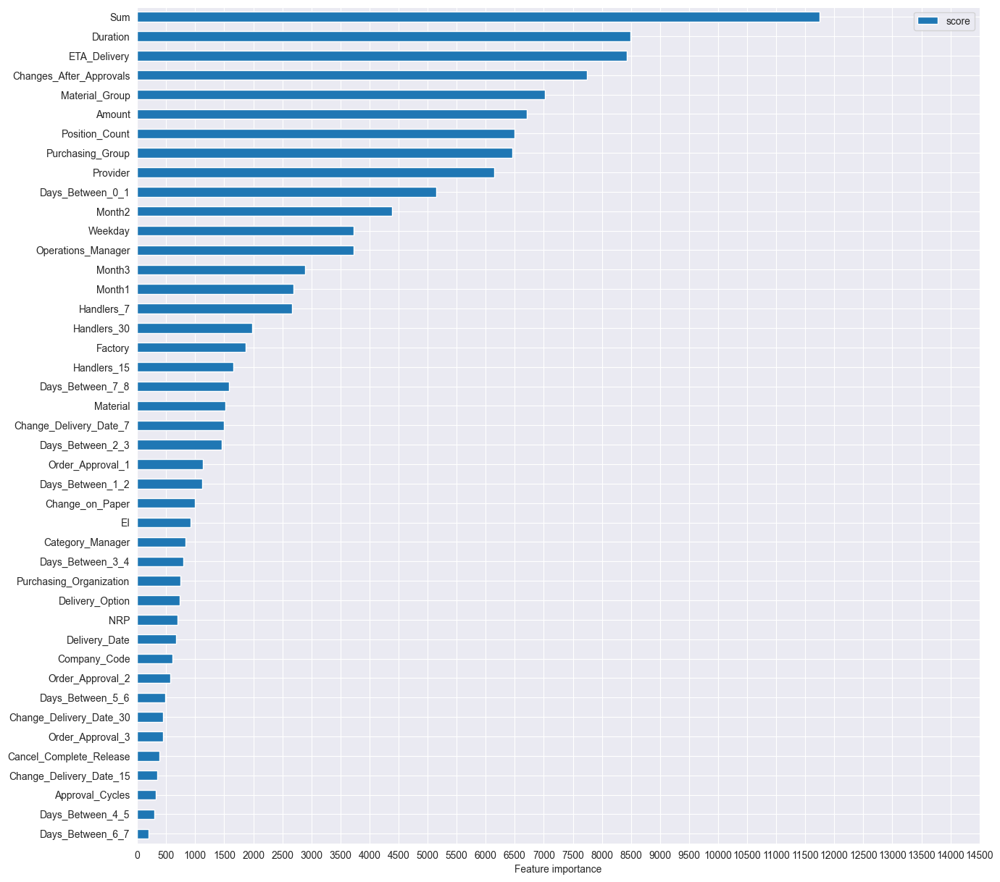

In [61]:
feature_importances = model_xgb.get_booster().get_score(importance_type='weight')
feature_names = list(feature_importances.keys())
feature_weights = list(feature_importances.values())

df_importances = pd.DataFrame(data=feature_weights, index=feature_names, columns=['score'])
df_importances = df_importances.sort_values('score', ascending=True)
df_importances.plot(kind='barh', figsize=(15, 15), xlabel='Feature importance', xticks=[tick for tick in range(0, 15000, 500)])
plt.show()

In [65]:
model_xgb_top_k = XGBClassifier(**params_xgb)
top_k_features = df_importances.index[:-4]
model_xgb_top_k.fit(X_train[top_k_features], y_train)
preds_xgb_top_k = model_xgb_top_k.predict(X_test[top_k_features])

In [66]:
valid_preds(y_test, preds_xgb_top_k)

F1-macro: 0.8273306689969774
ROC-AUC: 0.7982990742096185


In [62]:
X_train_p = X_train.copy()
X_test_p = X_test.copy()
CAT_FEATURES = ['Company_Code', 'Factory', 'Material',
                'Company_Code', 'Material_Group', 'Purchasing_Group', 'EI', 'Amount']
X_train_p = X_train_p.drop(CAT_FEATURES, axis=1)
X_test_p = X_test_p.drop(CAT_FEATURES, axis=1)

X_train_p['Diff'] = X_train_p['Duration'] - X_train['ETA_Delivery']
X_test_p['Diff'] = X_test_p['Duration'] - X_test_p['ETA_Delivery']


In [64]:
pca = PCA(n_components=3)
X_train_p = pca.fit_transform(X_train_p)
X_test_p = pca.transform(X_test_p)

In [89]:
x = X_train_p[:, 0]
y = X_train_p[:, 1]
z = X_train_p[:, 2]

plt.figure(figsize=(10, 10))
fig = px.scatter_3d(x=x, y=y, z=z, color=y_train, height=1200, width=1200)
fig.show()

<Figure size 1000x1000 with 0 Axes>

In [53]:
model_xgb_top_k_drop = XGBClassifier(**params_xgb)
# features_drop = ['Material', 'NRP', 'Category_Manager', 'Company_Code', 'EI', 'Days_Between_6_7',
#                  'Change_Delivery_Date_15', 'Change_Delivery_Date_30']


model_xgb_top_k_drop.fit(X_train_p, y_train)
preds_xgb_top_k_drop = model_xgb_top_k_drop.predict(X_test_p)

In [54]:
valid_preds(y_test, preds_xgb_top_k_drop)

F1-macro: 0.6529024338233247
ROC-AUC: 0.6254235553889068


In [26]:
valid_preds(y_test, preds_xgb_top_k_drop)

F1-macro: 0.8699145107061417
ROC-AUC: 0.8485954732526158


In [17]:
valid_preds(y_test, preds_xgb_top_k_drop)

F1-macro: 0.8954488783334781
ROC-AUC: 0.8817113004100319


In [15]:
valid_preds(y_test, preds_xgb_top_k_drop)

F1-macro: 0.8674073206855564
ROC-AUC: 0.8536031034096325


In [7]:
noise1 = np.random.normal(loc=0, scale=50, size=X_train_p.shape[0])
noise2 = np.random.normal(loc=0, scale=50, size=X_train_p.shape[0])
noise3 = np.random.normal(loc=0, scale=75, size=X_train_p.shape[0])
noise4 = np.random.normal(loc=0, scale=100, size=X_train_p.shape[0])
# X_train_p['n1'] = noise1
# X_train_p['n2'] = noise2
# X_train_p['n3'] = noise3
# X_train_p['n4'] = noise4
# X_test_p['n1'] = noise1[:X_test_p.shape[0]]
# X_test_p['n2'] = noise2[:X_test_p.shape[0]]
# X_test_p['n3'] = noise3[:X_test_p.shape[0]]
# X_test_p['n4'] = noise4[:X_test_p.shape[0]]

NameError: name 'X_train_p' is not defined

In [13]:
model_xgb_top_k_drop = XGBClassifier(**params_xgb)
model_xgb_top_k_drop.fit(X_train_p.drop(CAT_FEATURES, axis=1), y_train)

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device='cpu', early_stopping_rounds=None,
              enable_categorical=True, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, is_unbalance=True, lambda=0.2,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=3000,
              n_jobs=None, ...)

In [16]:
preds_xgb_top_k_drop = model_xgb_top_k_drop.predict(X_test_p.drop(CAT_FEATURES, axis=1))

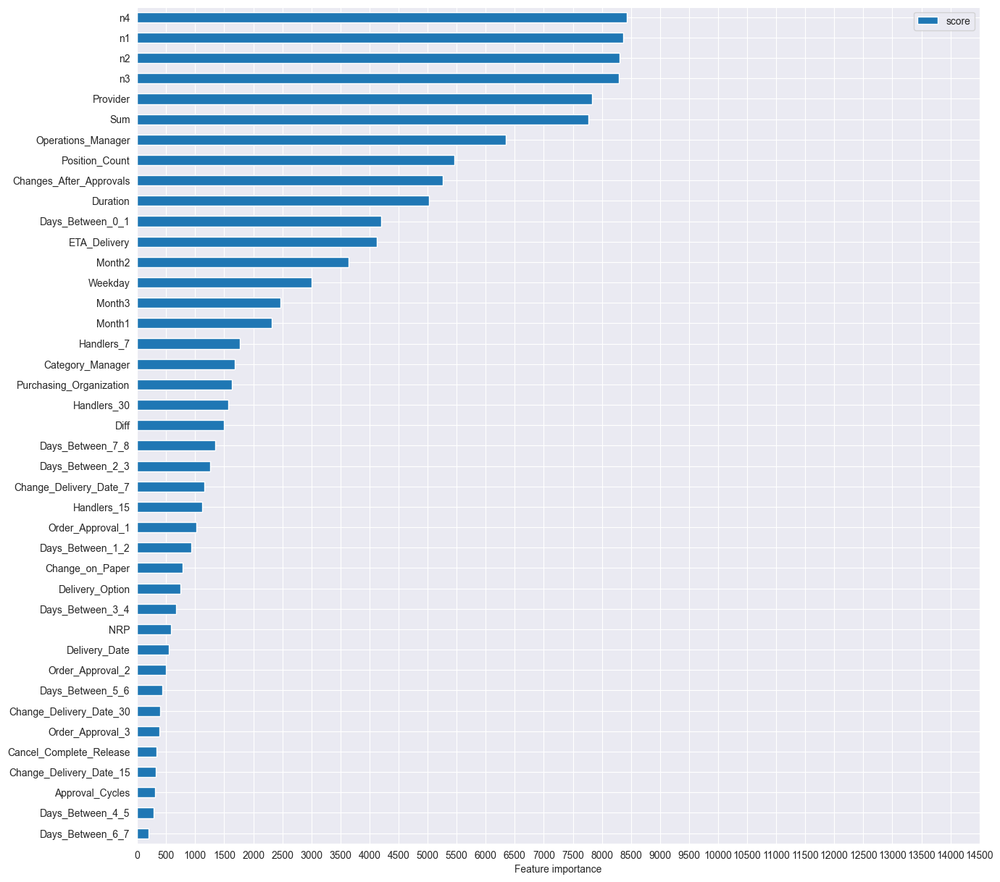

In [17]:
feature_importances = model_xgb_top_k_drop.get_booster().get_score(importance_type='weight')
feature_names = list(feature_importances.keys())
feature_weights = list(feature_importances.values())

df_importances = pd.DataFrame(data=feature_weights, index=feature_names, columns=['score'])
df_importances = df_importances.sort_values('score', ascending=True)
df_importances.plot(kind='barh', figsize=(15, 15), xlabel='Feature importance', xticks=[tick for tick in range(0, 15000, 500)])
plt.show()

In [19]:
valid_preds(y_test, preds_xgb_top_k_drop)

F1-macro: 0.8854598842716918
ROC-AUC: 0.8703166554809783
